stt742, sc68468

In [ ]:
import altair as alt
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from datetime import datetime
from dateutil import parser

from sklearn.preprocessing import MinMaxScaler
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import seasonal_decompose

alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [ ]:
file_path = 'gs://adult_income_cs329e/prim/adult_new.csv'
adult = pd.read_csv(file_path, encoding='latin-1')
adult.columns = ['workclass', 'occupation', 'race', 'sex', 'native_country', 'income', 'education_num', 'hours_per_week']

In [ ]:
file_path = 'gs://adult_income_cs329e/suppl/countries_new.csv'
sup_countries = pd.read_csv(file_path, encoding='latin-1')
sup_countries.columns = ['country', 'region', 'population_density', 'literacy', 'agriculture', 'industry', 'service']


In [ ]:
file_path = 'gs://adult_income_cs329e/clean/merged_country.parquet'
merged_country = pd.read_parquet(file_path)
merged_country.columns = ['native_country',	'income_rate',	'avg_ed',	'avg_hrs',	'sample_size', 'country',	'region',	'population_density',	'literacy', 'agriculture',	'industry',	'service']


In [ ]:
adult.sample(5)

,workclass,occupation,race,sex,native_country,income,education_num,hours_per_week
26696,Private,Transport-moving,White,1,United-States,0,9,78
8901,Private,Prof-specialty,White,0,United-States,0,9,40
18352,Private,Sales,White,1,United-States,1,9,44
13078,Private,Other-service,White,0,United-States,0,7,40
20089,Private,Adm-clerical,White,0,United-States,0,9,40


In [ ]:
sup_countries.sample(5)

,country,region,population_density,literacy,agriculture,industry,service
108,Kiribati,OCEANIA,130.0,0.0,0.089,0.242,0.668
222,West Bank,NEAR EAST,419.9,0.0,0.090,0.280,0.630
18,Belarus,C.W. OF IND. STATES,49.6,99.6,0.093,0.316,0.591
13,Azerbaijan,C.W. OF IND. STATES,91.9,97.0,0.141,0.457,0.402
145,Nepal,ASIA (EX. NEAR EAST),192.2,45.2,0.380,0.210,0.410


In [ ]:
merged_country.sample(5)

,native_country,income_rate,avg_ed,avg_hrs,sample_size,country,region,population_density,literacy,agriculture,industry,service
12,Jamaica,0.125000,9.812500,38.575000,80,Jamaica,LATIN AMER. & CARIB,250.9,87.9,0.049,0.337,0.615
15,Peru,0.066667,9.433333,35.900000,30,Peru,LATIN AMER. & CARIB,22.0,90.9,0.080,0.270,0.650
22,Vietnam,0.078125,9.515625,38.234375,64,Vietnam,ASIA (EX. NEAR EAST),256.1,90.3,0.209,0.410,0.381
8,Guatemala,0.047619,6.063492,39.222222,63,Guatemala,LATIN AMER. & CARIB,112.9,70.6,0.227,0.188,0.585
19,"Korea, South",0.197183,11.056338,44.464789,71,"Korea, South",ASIA (EX. NEAR EAST),496.0,97.9,0.033,0.403,0.563


##Part 1: Map Questions to Visualizations


1. How does the probability of earning more than $50K differ when considering gender and racial categories?

*Grouped Bar Chart*


2. What is the relationship between education level and the likelihood of earning more than $50K?

*Line Chart*

3. How do hours worked per week differ between income groups (≤$50K vs >$50K), and does this relationship change based on the occupation of the individual?

*Box plot and faceted box blot*

4. Which occupations have the highest proportion of high-income earners, and how do these patterns differ by education level?

*Heatmap, stacked bar chart*

5. How does an individual’s native country of origin relate to income, and how do these patterns change when comparing U.S.-born and non-U.S.-born individuals?

*Bubble plot*

6. When grouped by region, do immigrants from different regions show different income patterns in?

*Bar chart with error bars*

7. How does changing the income threshold (e.g., $40K, $50K, $60K) affect income disparity when comparing gender and race?

*Multi-line chart*



##Part 2: Create Visualizations


**Question 1:** How does the probability of earning more than $50K differ when considering age groups, gender, and racial categories?

Data Nature:
*   gender: categorical (binary)
*  race: categorical
*  income: binary (converted to probability)

Chart Mapping

1.   Grouped Bar Chart (income probability v. gender + race) - Both gender and race are categorical variables and the grouped bar chart will allow for a direct comparison of having an income higher than $50K across the categories. Through the graph we hope to see if gender gaps when it comes to pay exist between racial groups.


In [ ]:
adult['sex'] = adult['sex'].replace({
    1: 'Male',
    0: 'Female'
})

gender_race = adult.groupby(['sex','race']).agg(
    income_rate=('income','mean')
).reset_index()

alt.Chart(gender_race).mark_bar().encode(x= alt.X('race:N', title = 'Race'),
    y= alt.Y('income_rate:Q', title = 'Income Probability'),
    color='sex:N',
).properties(
    title='Income Probability by Race and Gender'
)

alt.Chart(...)

Insights

* Males have a significantly higher income probability across all of the racial groups, indicated by the higher bars in every age group. This is a clear representation of the gender income disparity that is prevalent regardless of a person's race.


*   Asian-Americans and Pacific Islanders have the highest overl income probability. Males have the highest probability of around 0.34 of being above $50K and females also have a relatively high probability when compared to the other racial groups. They have the highest representation in the higher-income bracket.
*   White individuals also have a high income probability, with the males being pretty close behind Asian-Americans with a probability of around 0.32.
*   The Black, Other, and American-Indian categories all show significantly lower income probability compared to the White and Asian_american groups. This indicates not only a gender disparity, but also a significant disparity between the variaous racial groups.
*   When it comes to the actual gender gap, it is the largest among White and Asian-American groups, so even though they have higher income probabilities, the actual income gap between gender in these racial groups is higher.





**Question 3:** What is the relationship between education level and the likelihood of earning more than $50K?

Data Nature:

*   education_num: ordered numberic
*   income: binary (converted to probability)

Chart Mapping

1.   Line Chart - This chart is going to show income probability by years of education. Education is ordinal and represents an individual gaining skills over time. The line chart will allow to visualize this gain in skills over time and show the retention/benefit (measured through the probability of earning a higher income) per year of additionlla income. We are aiming to see whether the income probability increases steadily or if there are significant jumps at certain educational thresholds.





In [ ]:
education_income = adult.groupby('education_num').agg(
    income_rate = ('income', 'mean')).reset_index()
alt.Chart(education_income).mark_line(point = True).encode(x = alt.X('education_num:Q', title = 'Years of Education'),
                y = alt.Y('income_rate:Q', title = 'Probability of High Income')).properties(
                title = 'Income Probability by Education Level')

alt.Chart(...)

Insights

*   Income probability increases very strongly with education. From 1-8 years the income probability stays pretty low. This makes sense because this is the group of people that have not completed high school. Starting around 9-10 years the probability increases a little more noticeably because they have some high school education. The jump in probability becomes very noticable after 12 years of education because at this point people have a high school diploma. From there, the probability continues to grow significantly faster than from 1-12 years.
*  There are specific thresholds when it comes to jump in probability that somewhat aligns with the education cycle.
From 8-10 years the probability doubles. Then from 10-12 the probability grows by around 1.5 times. Finally from 12-15, the probability grows at a pretty steady rate at close to 2 or greater than 2 times per year.

*   As expected, the lower education years have a probability very tightly clustered between 0 and 0.8 with very little upward movement. This means that there is very little income mobility at lower education levels. However, after 12 years, the slope becomes steeper meaning that education has disproportionately large effects on earning a high-income.

*   There is a slight plateu between 15 and 16 years indicated that there might be diminishing marginal returns after around 15 years of education. This brings up the possibility that after 16 years adding more and more years might not dramatically increase the probability of earning a higher income.








**Question 3:** How do hours worked per week differ between income groups, and does relationship change based on the occupation of the individual?

Data Nature:
*   hours_per_week: continuous numeric
*   income: binary (converted to probability)
*   occupation: categorial

Chart Mapping


1.   Boxplot (Hours by Income Group) - Boxplots summarize the median, quartiles, and spread of the data, so this will alow for comparison of the distribution overlap between the two income groups. The main goal behind this graph is to see whether high earners consistently work more hours or if the distributions of the hours worked overlap significantly.

2.   Faceted Boxplots (Hours by Income within Occupation) - Faceting the boxplots helps to visualize whether occupation moderates the relationship that we established between the hours worked and the income group. The main goal behind this graph is to add on to the observations made in the previous plot to see if the occupation structure helps to better explain the relationship between hours worked and income.







In [33]:
alt.data_transformers.disable_max_rows()
adult['income_label'] = adult['income'].replace({
    0: '≤ $50K',
    1: '> $50K'
}).copy()
alt.Chart(adult).mark_boxplot().encode(
    x=alt.X('income_label:O', title='Income Group'),
    y=alt.Y('hours_per_week:Q', title='Hours per Week'),
    color=alt.Color('income:O', title='Income Group')
).properties(
    title='Distribution of Weekly Hours by Income Group'
)

alt.Chart(...)

In [35]:
adult['occupation_short'] = adult['occupation'].str.replace('-', '\n')
adult_top8 = adult['occupation'].value_counts().nlargest(8).index
top_occupations = adult[adult['occupation'].isin(adult_top8)]
alt.Chart(adult).mark_boxplot(extent = 'min-max').encode(x = alt.X('income_label:N', title = 'Income Group'),
                                       y = alt.Y('hours_per_week:Q', title = ' Hours per Week')).facet(facet ='occupation_short:N', columns = 7
                                       ).properties(title = 'Hours Worked by Income Group Across Occupations',
                                       )

alt.FacetChart(...)

Insights
*   Higher income is directly related with longer working hours at the aggregate level, indicated by the >$50K group showing a higher median and upward-shifted distribution. However, the overlap between income groups indicates that hours worked alone is not the only determiinating factor of income.
*   The relationship between hours and income is clearly dependent on occupation at very significantly. In fields such as executive-managerial, sales, and transport-moving, higher-income individuals lean towards working noticeably longer hours, indicating labor intensity contributes more strongly to income differences in these roles.


*   In several occupations, increased hours do not really translate to proportionally higher income. Roles such as other-service and handlers-cleaners show limited upward income mobility despite long working hours, indicating structural wage ceilings or occupational constraints.
*  Occupational structure appears to be a stronger determinant of income than hours worked alone. While working more hours may increase income probability within certain fields, institutional role, skill level, and occupational positioning play a more signifiacnt role in shaping income outcomes.

5. Which occupations have the highest proportion of high-income earners, and how do these patterns differ by education level?


Heatmap

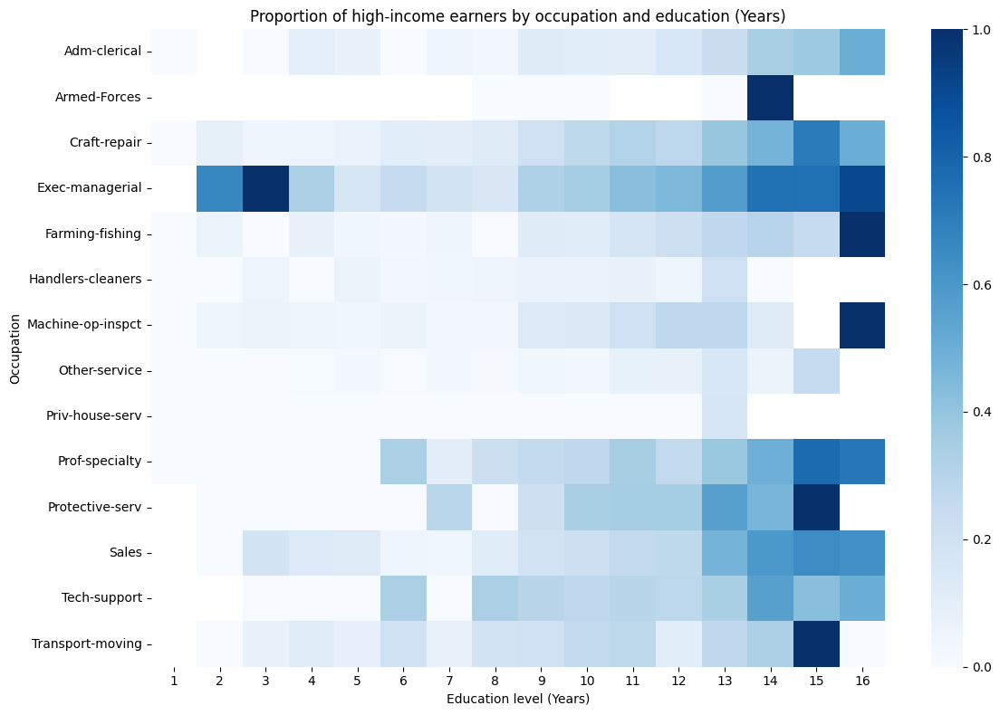

In [ ]:
#group earners make >50K
q5 = (adult.assign(
          occupation=adult['occupation'].astype(str).str.strip())
      .groupby(['occupation', 'education_num'])['income']
      .mean()
      .reset_index(name='high_income_prop'))

plt.figure(figsize=(12, 8))
heatmap_data = q5.pivot(index='occupation', columns='education_num', values='high_income_prop')
sns.heatmap(heatmap_data, cmap='Blues', annot=False)
plt.title("Proportion of high-income earners by occupation and education (Years)")
plt.ylabel("Occupation")
plt.xlabel("Education level (Years)")
plt.tight_layout()
plt.show()


Stacked bar charts

In [ ]:
stacked_bar = alt.Chart(q5).mark_bar().encode(x=alt.X('occupation:N', sort='-y', title='Occupation'),
    y=alt.Y('high_income_prop:Q', title='Proportion of High Income'),
    color=alt.Color('education_num:O', title='Education Level (Years)', scale = alt.Scale(scheme='yellowgreenblue') ),
    tooltip=['occupation', 'education_num', alt.Tooltip('high_income_prop:Q', format='.2%')]).properties(width=700, height=400,
    title="High-Income Proportion Breakdown by Occupation and Education")
stacked_bar.show()

alt.Chart(...)

Based on the 2 figures, we can see that occupations with highest high-income proportions are exec-manegerial, prof-specialty, and sales.

The patterns also differ by education level:
- The general trend is that income would typically increase with years of education.
- Most occupations (especially protective-serv, craft-repair, and sales) see their most dramatic increase in high-income representation at exactly 14 and 15 years of education.
- Exec-managerial is unique because it shows a moderate proportion of high earners even at mid-range education levels (3–5 years), though it still peaks significantly at 16 years of education.
- For Prof-specialty and Tech-support, the proportion of high-income earners is negligible at low education levels (1–8 years) but spikes once reaching higher education (13–16 years).
- However, roles like Handlers-cleaners, Other-service, and Priv-house-serv show very low proportions of high-income earners regardless of the years of education completed.

6. How does an individual’s native country of origin relate to income, and how do these patterns change when comparing U.S.-born and non-U.S.-born individuals?

Box plot

In [ ]:
#recalculate countries' statistics
if not merged_country.empty:
    q6 = merged_country.copy()
    q6['native_country'] = q6['native_country'].astype(str).str.strip()
    q6['origin_status'] = np.where(q6['native_country'] == 'United-States', 'U.S.-born', 'Non-U.S.-born')
bubble = alt.Chart(q6).mark_circle(opacity=0.7).encode(
        x=alt.X('native_country:N', title='Native Country', sort='-y'),
        y=alt.Y('income_rate:Q', title='Income Rate'),
        size=alt.Size('sample_size:Q', title='Sample Size', scale=alt.Scale(type='log')),
        color=alt.Color('origin_status:N', title='Origin Status', scale=alt.Scale(scheme='set2')),
        tooltip=['native_country', 'income_rate', 'sample_size', 'origin_status']
    ).properties(
        width=800, height=400,
        title="Income rate by native country"
    )
bubble.show()

alt.Chart(...)

When comparing origin status, the data reveals significant differences in income distribution:

- Non-U.S.-born individuals represent both the highest and lowest ends of the income spectrum. For example, individuals from Taiwan and India (non-U.S.-born) significantly outperform the average U.S.-born income rate.

- The United States (U.S.-born) has a much larger sample size (largest bubble) compared to all other nations, yet its income rate (~0.25) is surpassed by several non-U.S.-born groups.

An individual's native country also shows correlations with their income rate:

- Highest: Taiwan (0.45), France, and India (0.40) represent the top-earning countries of origin.

- Mid-Range: Countries like the United Kingdom, Japan, and the United States (~0.25) occupy the middle of the spectrum.

- Lowest: individuals from Guatemala and the Dominican Republic has the lowest income rate, falling below 0.05.

7. When grouped by region, do immigrants from different regions show different income patterns?

Bar chart with error bars

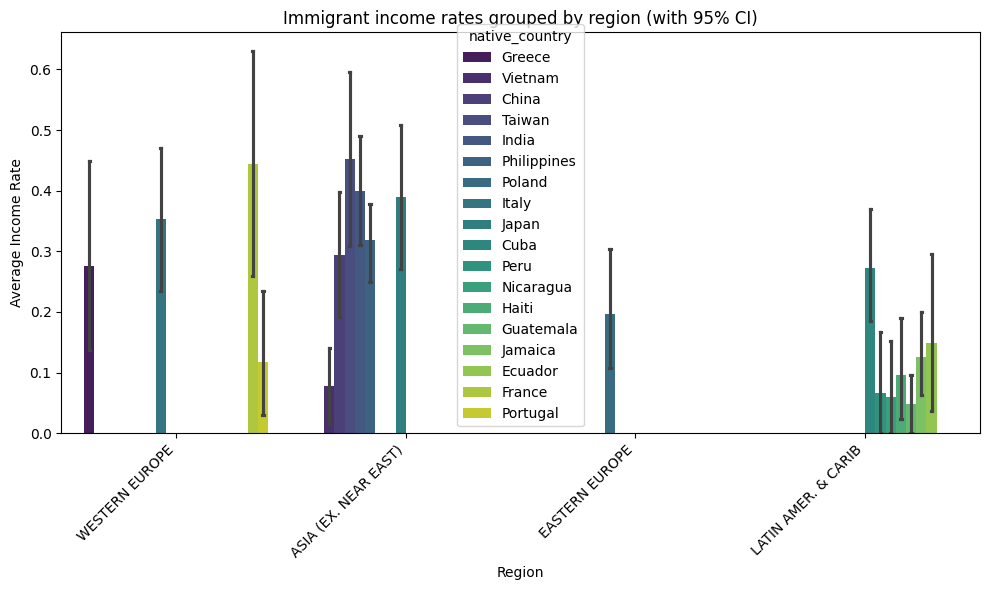

In [ ]:
if not merged_country.empty:
    merged_country['native_country'] = merged_country['native_country'].astype(str).str.strip()
    region_map = dict(zip(merged_country['native_country'], merged_country['region']))
    q7_data = adult.assign(native_country=adult['native_country'].astype(str).str.strip())
    q7_data['region'] = q7_data['native_country'].map(region_map)
    immigrants_df = q7_data[q7_data['native_country'] != 'United-States'].dropna(subset=['region'])

plt.figure(figsize=(10, 6))
sns.barplot(data=immigrants_df,
        x='region',
        y='income',
        hue='native_country',
        errorbar='ci',
        capsize=0.1,
        palette='viridis')
plt.title("Immigrant income rates grouped by region (with 95% CI)")
plt.xlabel("Region")
plt.ylabel("Average Income Rate")
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

The data reveals a clear hierarchy in average income rates across the four analyzed regions:

- Western Europe & Asia (Ex. Near East): These regions generally display the highest average income rates but also show a wide range of income rates among countries in the same region. France (within Western Europe) and Taiwan and India (within Asia) stand out as top performers with average rates approaching or exceeding 0.40. Shows the highest internal disparity, with average rates ranging from below 0.10 (Vietnam) to over 0.45 (Taiwan). Western europe also displays a wide gap, notably between the high-performing France and the significantly lower Portugal.

- Eastern Europe: This region shows a mid-range income pattern, largely driven by Poland, which has an average income rate of approximately 0.20.

- Latin Amer. & Carib: This region has the lowest income patterns among the groups. Most countries in this category, such as Nicaragua and Guatemala, show average income rates below 0.10.

8. How does changing the income threshold (e.g., $40K, $50K, $60K) affect income disparity when comparing gender and race?

Multi-line chart

In [ ]:
np.random.seed(42)
q8 = adult.assign(
    sex_label=adult['sex'].map({0: 'Female', 1: 'Male'}),
    race=adult['race'].astype(str).str.strip())
q8['simulated_income'] = np.random.normal(40000, 10000, size=len(q8)) + (q8['income'] * 20000)

thresholds = [40000, 50000, 60000]
results = []

for t in thresholds:
    prop = (q8.assign(above_thresh=(q8['simulated_income'] > t).astype(int))
            .groupby(['sex_label', 'race'])['above_thresh']
            .mean()
            .reset_index(name='proportion'))
    prop['threshold'] = f'${t//1000}K'
    results.append(prop)

q8_fin = pd.concat(results, ignore_index=True)
base = alt.Chart(q8_fin).encode(
    x=alt.X('threshold:O', title='Income Threshold', sort=['$40K', '$50K', '$60K']),
    y=alt.Y('proportion:Q', title='Proportion Above Threshold'),
    color=alt.Color('race:N', title='Race', scale=alt.Scale(scheme='set1')),
    detail='sex_label:N')
lines = base.mark_line(opacity=0.5)

points = base.mark_point(size=100, filled=True, opacity=1).encode(
    shape=alt.Shape('sex_label:N',
        title='Gender',
        scale=alt.Scale(domain=['Male', 'Female'],
            range=['triangle', 'circle'])),
    tooltip=['threshold', 'sex_label', 'race', alt.Tooltip('proportion:Q', format='.2%')])

chart = (lines + points).properties(width=600,
    height=400,
    title="Income disparity across thresholds by gender and race").configure_point(size=100)

chart.show()

alt.LayerChart(...)

Based on the line chart, increasing the income threshold significantly widens the disparities between groups.

Gender: The chart reveals a persistent and widening gap between genders across every threshold.
- At the $40K threshold, the highest-performing male groups (White and Asian-Pac-Islander) sit between 0.65 and 0.66, while their female counterparts are significantly lower, between 0.53 and 0.54.

- As the threshold increases to $60K, the proportion of females above the line drops sharply to approximately 0.06 to 0.09, while the top male groups maintain a much higher proportion near 0.16 to 0.18.

Race: disparities in this category are more pronounced as the income requirements are more stringent.
- Asian-Pac-Islander and White individuals (represented by blue and orange lines) consistently maintain the highest proportions across all thresholds.

- Individuals identified as Other (purple) and Amer-Indian-Eskimo (red) experience the steepest declines. The "Other" female group drops from nearly 0.54 at $40K to the lowest overall position of roughly 0.05 at $60K.

- At the $60K mark, most racial groups (excluding White and Asian males) converge at a very low proportion (below 0.11), suggesting that reaching the highest income tier is significantly difficult for these demographics, regardless of gender.

##Part 3: Analytical & Statistical Methods


We build a network where countries are "connected" if their income rates are within, say, 3% of each other.

In [ ]:
import networkx as nx

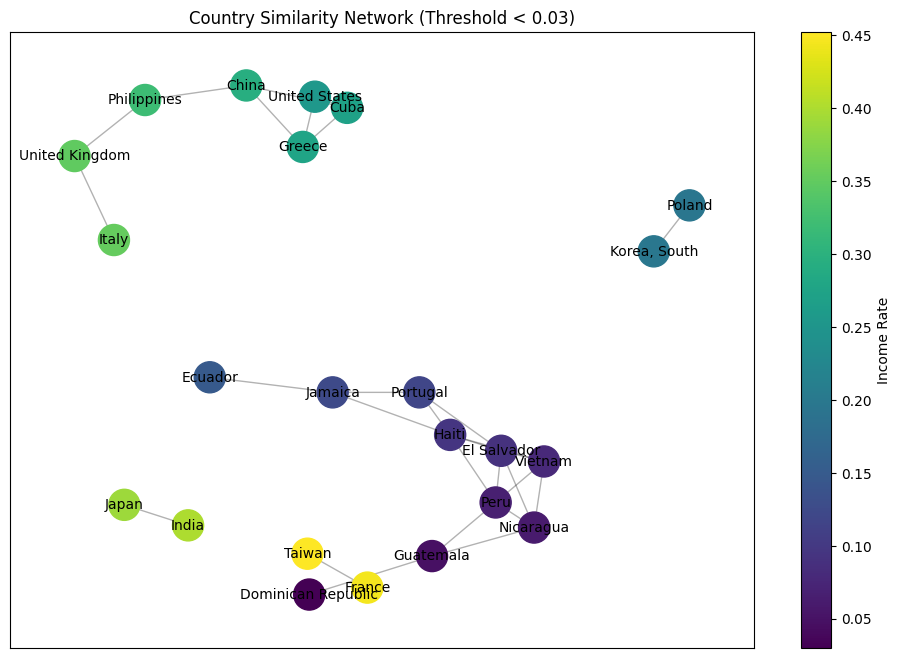

In [ ]:
G = nx.Graph()

for index, row in merged_country.iterrows():
    G.add_node(row['native_country'], income=row['income_rate'])

threshold = 0.03
nodes = list(G.nodes(data=True))

for i in range(len(nodes)):
    for j in range(i + 1, len(nodes)):
        node_a, data_a = nodes[i]
        node_b, data_b = nodes[j]
        diff = abs(data_a['income'] - data_b['income'])
        if diff < threshold:
            G.add_edge(node_a, node_b, weight=1-diff)

plt.figure(figsize=(12, 8))
pos = nx.spring_layout(G, k=0.5, seed=42)

node_colors = [data['income'] for n, data in G.nodes(data=True)]
nodes_draw = nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.viridis, node_size=500)

nx.draw_networkx_edges(G, pos, alpha=0.3)
nx.draw_networkx_labels(G, pos, font_size=10)

plt.colorbar(nodes_draw, label='Income Rate')
plt.title(f"Country Similarity Network (Threshold < {threshold})")
plt.show()

We use networkX with each node represent a country, it's colored based on a scale from low (purple) to high income rate (yellow), the edges connect the countries whose income rates are within 3% of each other.

This network graph reveals that economic similarity creates a global web that goes beyond traditional geographic boundaries. By connecting countries within a 3% income rate threshold, several key properties are:

- The graph naturally shows wealth disparity among countries by showing distinct "tiers" where higher-income nations like France, Taiwan, and Japan are in the margin of this network, showing they have fewer economic neighbors within a 3% gap compared to the mid-income majority.

- A dense cluster exists among lower-to-mid income countries—such as Peru, Nicaragua, El Salvador, and Vietnam. This indicates they share a very narrow and consistent income range.

- The graph also reveals that nations with vastly different geographic and political contexts, such as the United States, China, Greece, and Cuba, actually share nearly identical income rates in this dataset.